In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
! pip install -q kaggle

In [ ]:
from google.colab import files 

In [ ]:
 files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rizwankhadim","key":"3cdcde5820733ad4b3ee5218f0ecea8f"}'}

In [ ]:
! mkdir ~/.kaggle 

In [ ]:
! cp kaggle.json ~/.kaggle/

In [ ]:
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
 !kaggle datasets list

ref                                                             title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
--------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
meirnizri/covid19-dataset                                       COVID-19 Dataset                                      5MB  2022-11-13 15:47:17           9743        286  1.0              
mattop/alcohol-consumption-per-capita-2016                      Alcohol Consumption Per Capita 2016                   4KB  2022-12-09 00:03:11           1020         39  1.0              
michals22/coffee-dataset                                        Coffee dataset                                       24KB  2022-12-15 20:02:12           1183         43  1.0              
thedevastator/jobs-dataset-from-glassdoor                   

In [ ]:
import os
import shutil
os.listdir('/content/drive/MyDrive/skincancer')

['skin-cancer-mnist-ham10000.zip']

In [ ]:
source = '/content'
destination = '/content/drive/MyDrive/skincancer'

In [ ]:
filename = 'skin-cancer-mnist-ham10000.zip'

In [ ]:
sourcePath=os.path.join(source, filename)

In [ ]:
shutil.move(sourcePath, destination)

'/content/drive/MyDrive/skincancer/skin-cancer-mnist-ham10000.zip'

In [2]:
datasetPath = '/content/drive/MyDrive/skincancer/skin-cancer-mnist-ham10000.zip'

In [ ]:
# !kaggle datasets download -d kmader/skin-cancer-mnist-ham10000

In [ ]:
!mkdir '/content/dataset'

In [ ]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')

zip_ref = zipfile.ZipFile(datasetPath, 'r')
zip_ref.extractall("/content/dataset")
zip_ref.close()

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
import os

In [ ]:
os.listdir()

['.config', 'drive', 'sample_data']

In [ ]:
BASE_PATH = 'HAM10000_images_part_1/'
hair_images =['ISIC_0025116','ISIC_0025100','ISIC_0025495','ISIC_0025878','ISIC_0026156','ISIC_0026242','ISIC_0026287','ISIC_0026675','ISIC_0026798','ISIC_0026964','ISIC_0027072']

In [ ]:
for i,image_name in enumerate(hair_images):
    print(os.path.exists(BASE_PATH+'/' + image_name + '.jpg'))

True
True
True
True
True
True
True
True
True
True
True


In [ ]:
image = cv2.imread(BASE_PATH +'/'+ image_name + '.jpg')
image.shape

(450, 600, 3)

[]

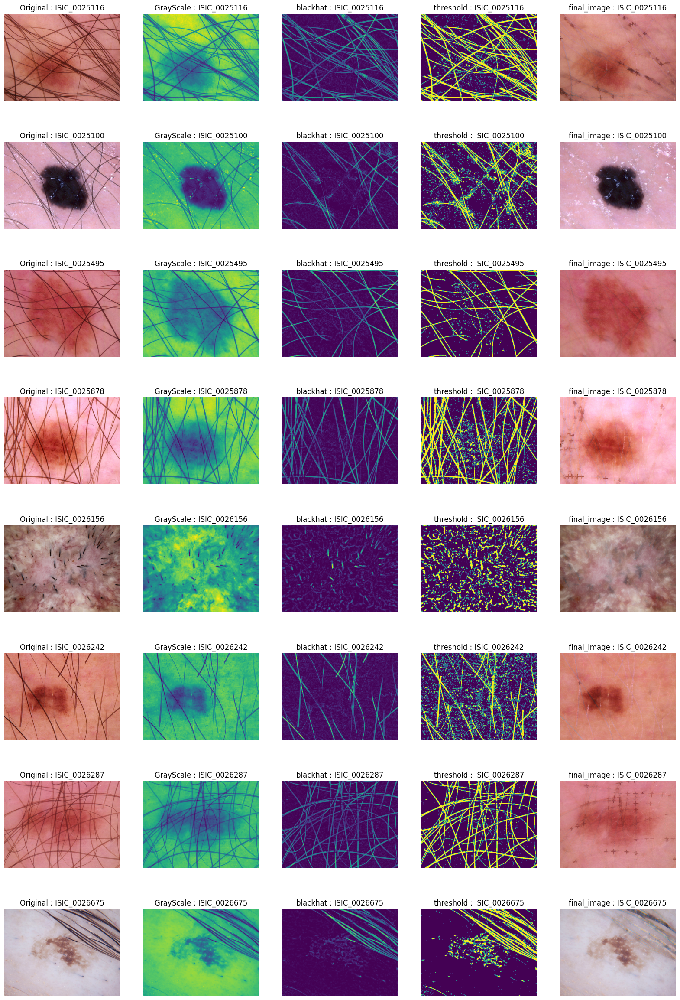

In [ ]:
l = len(hair_images[:8])

fig = plt.figure(figsize=(20,30))

for i,image_name in enumerate(hair_images[:8]):
    
    
    image = cv2.imread(BASE_PATH +'/'+ image_name + '.jpg')
#     image_resize = cv2.resize(image,(1024,1024))
    image_resize = image
    plt.subplot(l, 5, (i*5)+1)
    # Convert the original image to grayscale
    plt.imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original : '+ image_name)
    
    grayScale = cv2.cvtColor(image_resize, cv2.COLOR_RGB2GRAY)
    plt.subplot(l, 5, (i*5)+2)
    plt.imshow(grayScale)
    plt.axis('off')
    plt.title('GrayScale : '+ image_name)
    
    # Kernel for the morphological filtering
    kernel = cv2.getStructuringElement(1,(17,17))
    
    # Perform the blackHat filtering on the grayscale image to find the hair countours
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    plt.subplot(l, 5, (i*5)+3)
    plt.imshow(blackhat)
    plt.axis('off')
    plt.title('blackhat : '+ image_name)
    
    # intensify the hair countours in preparation for the inpainting 
    ret,threshold = cv2.threshold(blackhat,10,255,cv2.THRESH_BINARY)
    plt.subplot(l, 5, (i*5)+4)
    plt.imshow(threshold)
    plt.axis('off')
    plt.title('threshold : '+ image_name)
    
    # inpaint the original image depending on the mask
    final_image = cv2.inpaint(image_resize,threshold,1,cv2.INPAINT_TELEA)
    plt.subplot(l, 5, (i*5)+5)
    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('final_image : '+ image_name)
       
plt.plot()

In [ ]:
def hair_remove(image):
    # convert image to grayScale
    grayScale = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    
    # kernel for morphologyEx
    kernel = cv2.getStructuringElement(1,(17,17))
    
    # apply MORPH_BLACKHAT to grayScale image
    blackhat = cv2.morphologyEx(grayScale, cv2.MORPH_BLACKHAT, kernel)
    
    # apply thresholding to blackhat
    _,threshold = cv2.threshold(blackhat,5,255,cv2.THRESH_BINARY)
    
    # inpaint with original image and threshold image
    final_image = cv2.inpaint(image,threshold,1,cv2.INPAINT_TELEA)
    
    return final_image

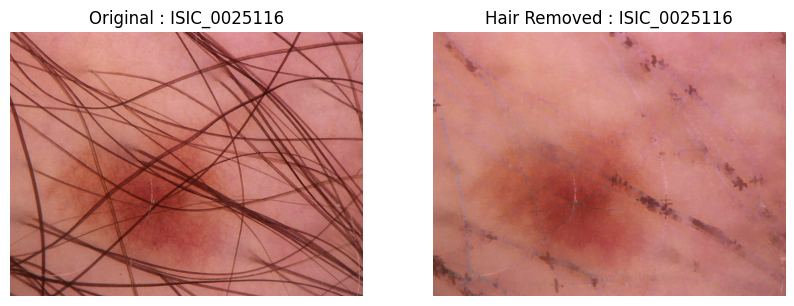

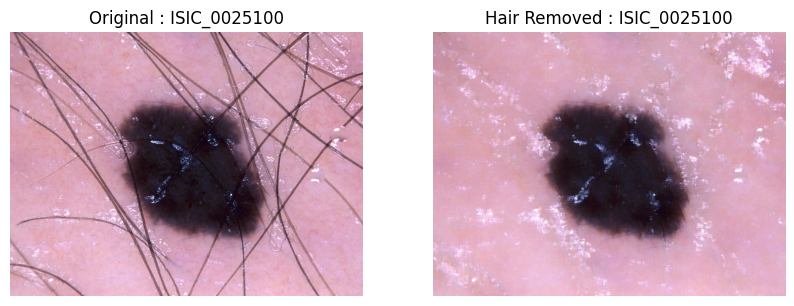

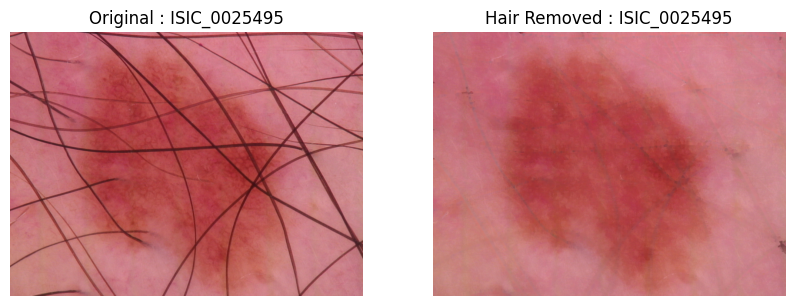

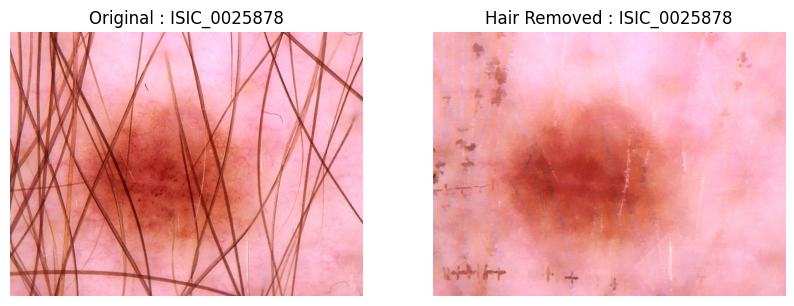

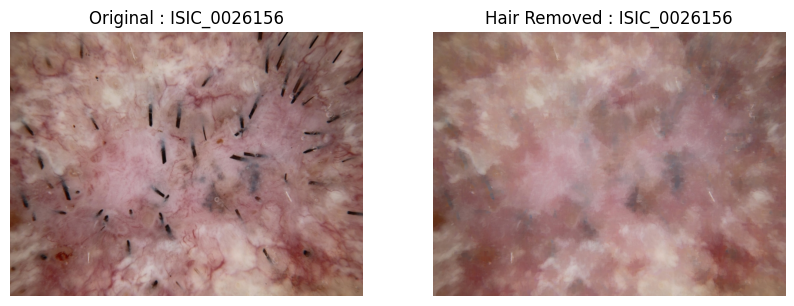

...

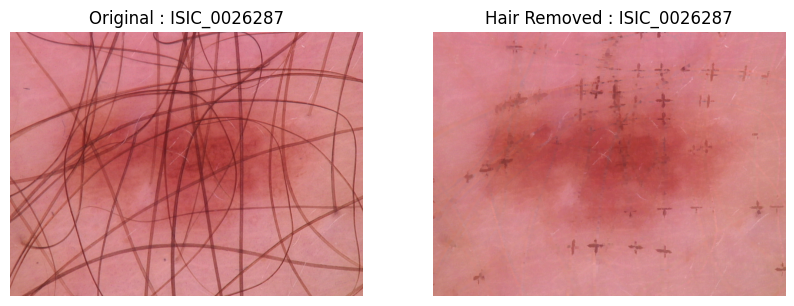

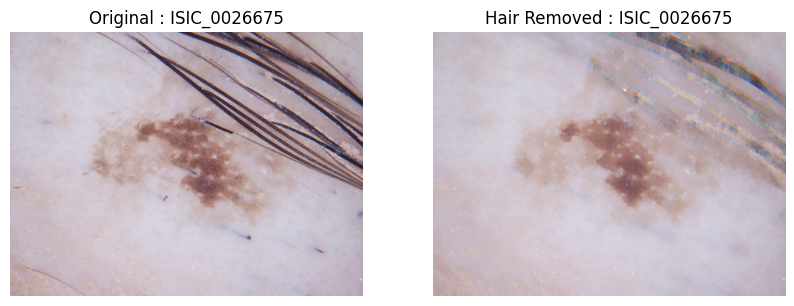

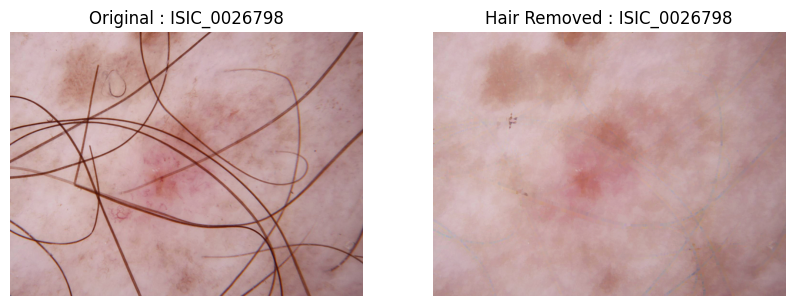

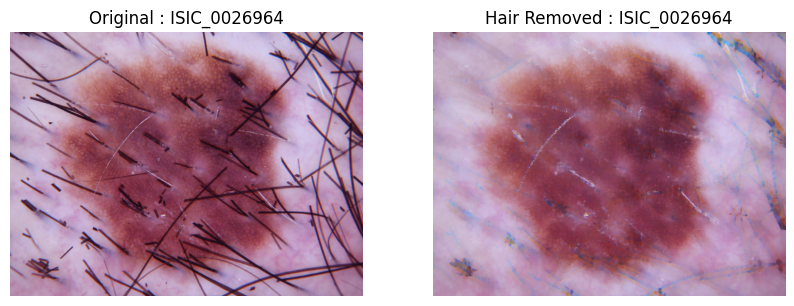

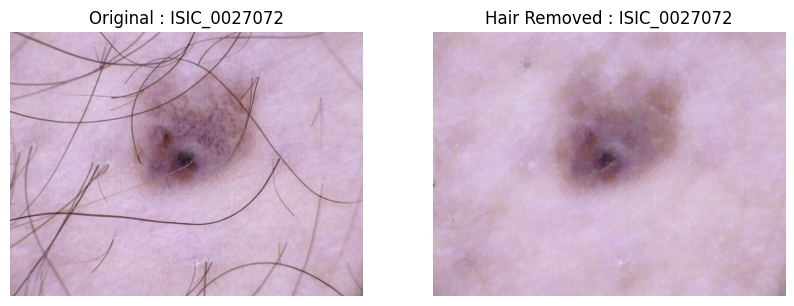

In [ ]:
for i,image_name in enumerate(hair_images):
    
    fig = plt.figure(figsize=(10,5))
    
    image = cv2.imread(BASE_PATH +'/'+ image_name + '.jpg')
#     image_resize = cv2.resize(image,(1024,1024))
    image_resize = image

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_resize, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Original : '+ image_name)
    
    final_image = hair_remove(image_resize)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title('Hair Removed : '+ image_name)
    
    plt.plot()

In [4]:
import numpy as np          
import pandas as pd         
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import keras
from keras.models import Sequential, load_model
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.layers.core import Dropout, Activation
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, Flatten, \
     Dense, Input, Activation, Dropout, GlobalAveragePooling2D, AveragePooling2D
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
from keras.models import Model
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau
import cv2
from cv2 import imread, resize # manipulating the images
from tensorflow.keras.optimizers import Adam
import os

In [ ]:
# os.listdir('dataset')

In [5]:
df_skin = pd.read_csv('/content/drive/MyDrive/skin/HAM10000_metadata.csv')
# Display the first 10 lines
df_skin.head(10)

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
5,HAM_0001466,ISIC_0027850,bkl,histo,75.0,male,ear
6,HAM_0002761,ISIC_0029176,bkl,histo,60.0,male,face
7,HAM_0002761,ISIC_0029068,bkl,histo,60.0,male,face
8,HAM_0005132,ISIC_0025837,bkl,histo,70.0,female,back
9,HAM_0005132,ISIC_0025209,bkl,histo,70.0,female,back


In [6]:
# Lesion/dis names are given in the description of the data set.
lesion_type_dict = {
    'nv': 'Melanocytic nevi',
    'mel': 'Melanoma',
    'bkl': 'Benign keratosis-like lesions ',
    'bcc': 'Basal cell carcinoma',
    'akiec': 'Actinic keratoses',
    'vasc': 'Vascular lesions',
    'df': 'Dermatofibroma'
}

lesion_ID_dict = {
    'nv': 0,
    'mel': 1,
    'bkl': 2,
    'bcc': 3,
    'akiec': 4,
    'vasc': 5,
    'df': 6
}

# Lesion and it's abbriv.
lesion_names = ['Melanocytic nevi','Melanoma','Benign keratosis-like lesions ',
               'Basal cell carcinoma','Actinic keratoses','Vascular lesions',
               'Dermatofibroma']
lesion_names_short = ['nv','mel','bkl','bcc','akiec','vasc','df']

# Maping the lesion type and ID to a dict.
df_skin['lesion_type']=df_skin['dx'].map(lesion_type_dict)
df_skin['lesion_ID'] = df_skin['dx'].map(lesion_ID_dict)

# Display the total found images.
print('Total number of images', len(df_skin))
print('The problem is unbalanced, since Melanocytic nevi is much more frequent that other labels')

# Display the count of each lesion.
df_skin['lesion_type'].value_counts()

Total number of images 10015
The problem is unbalanced, since Melanocytic nevi is much more frequent that other labels


Melanocytic nevi                  6705
Melanoma                          1113
Benign keratosis-like lesions     1099
Basal cell carcinoma               514
Actinic keratoses                  327
Vascular lesions                   142
Dermatofibroma                     115
Name: lesion_type, dtype: int64

In [ ]:
fname_images = np.array(df_skin['image_id'])
file_to_read ='HAM10000_images_part_1/'+str(fname_images[13])+'.jpg'

# Resizing the read image to 100x100
img = imread(file_to_read)
img2 = resize(img, (100, 100))

# Show one exampe image before and after
plt.figure(figsize = (10, 5))
plt.subplot(1, 2, 1)
plt.imshow(img[:, :, ::-1])
plt.title('Original image')
plt.subplot(1, 2, 2)
plt.imshow(img2[:, :, ::-1])
plt.title('Resized image for DenseNet')
plt.show()

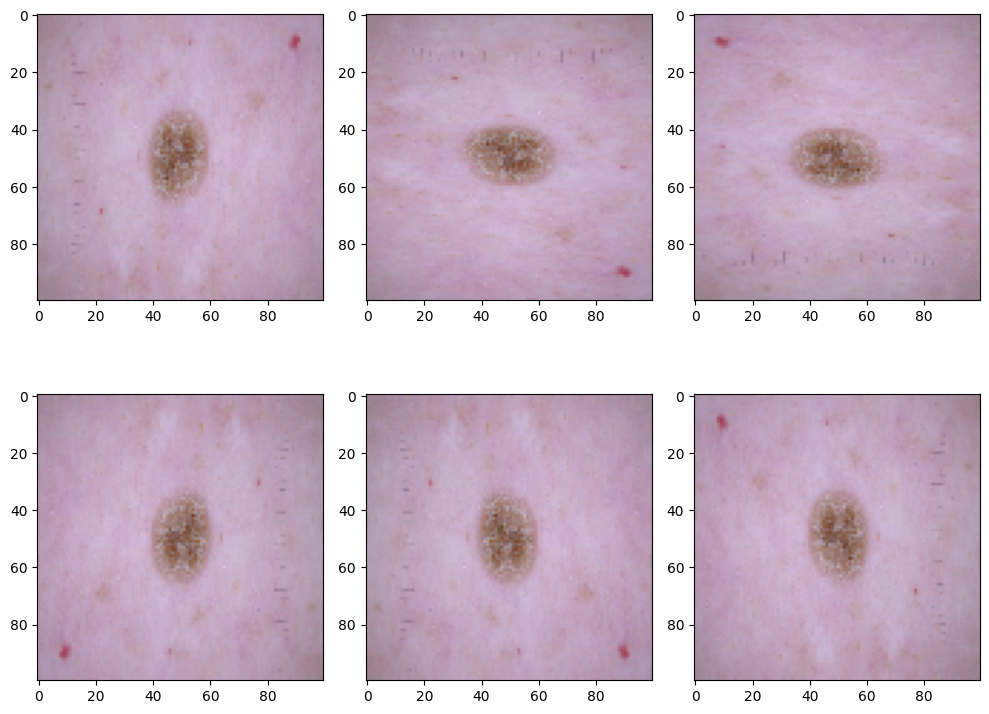

In [ ]:
def produce_new_img(img2: cv2) -> tuple:
    """
    function to reproduse a new manipulated (rotating of flipping the original one)
    image from the read one, To increase the dimension of the dataset, avoiding overfitting of a single class.

    Args:
        img2 (cv2): the read image from cv2 module.

    Returns:
        new_images (tuple): a tuple of the new manipulated images.
    """
    imga = cv2.rotate(img2, cv2.ROTATE_90_CLOCKWISE) #90
    imgb = cv2.rotate(img2, cv2.ROTATE_90_COUNTERCLOCKWISE) #270
    imgc = cv2.rotate(img2, cv2.ROTATE_180)

    imgd = cv2.flip(img2, 0)
    imge = cv2.flip(img2, 1)
    new_imges = imga, imgb, imgc, imgd ,imge
    return new_imges

def show_example() -> None:
    """
    Display an image after manipulating it in produce_new_img() function
    """
    plt.figure(figsize = (10, 8))
    plt.subplot(2, 3, 1)
    plt.imshow(img2[:, :, ::-1])
    for i in range(5):
        plt.subplot(2, 3, 2+i)
        plt.imshow(new_img[i][:, :, ::-1])
    plt.tight_layout()
    plt.show()

# Invoking our function :)
new_img = produce_new_img(img2)
# Display an example by invoking show_example func
show_example()

In [ ]:
x = []          # Hold resized images.
y = []          # Hold image lesion ID from the data set.

# Listing all files in the part_1, part_2 dirs
lista1 = os.listdir('HAM10000_images_part_1/')
lista2 = os.listdir('HAM10000_images_part_2/')

# [+] Handling images from part 1 directory
for i in range(len(lista1)):
    # [+] Features: reading and resize the photo.
    fname_image = lista1[i]
    fname_ID = fname_image.replace('.jpg', '')
    file_to_read ='HAM10000_images_part_1/' + str(fname_image)  # resolve image name
    img = imread(file_to_read)                                  # read the image
    img_clean = hair_remove(img)
    img2 = resize(img_clean,(100, 100))                               # resise our image
    x.append(img2)                                              # append the new image to the list x.
    
    # Targets: Finding the image lesion ID and append it to the y list.
    output = np.array(df_skin[df_skin['image_id'] == fname_ID].lesion_ID)
    y.append(output[0])
    
    # add more images for class between 1-6, rotating them 
    if output != 0:
        new_img = produce_new_img(img2)
        for i in range(5):
            x.append(new_img[i])
            y.append(output[0])

    # inform the user with the number of loaded images each 100 img.
    if i % 100 == 0:
        print(i, 'images loaded')

print("*********************************************")
# [+] Handling images from part 2 directory
for i in range(len(lista2)):

    # [+] Features: reading and resize the photo.
    fname_image = lista2[i]
    fname_ID = fname_image.replace('.jpg', '')
    file_to_read ='HAM10000_images_part_2/' + str(fname_image)


    img = imread(file_to_read)
    img_clean = hair_remove(img)
    img2 = resize(img_clean, (100, 100))
    x.append(img2)
    
    # Targets: Finding the image lesion ID and append it to the y list.
    output = np.array(df_skin[df_skin['image_id'] == fname_ID].lesion_ID)
    y.append(output[0])
    
    # [+] Add more images for class between 1-6
    if output != 0:
        new_img = produce_new_img(img2)
        for i in range(5):
            x.append(new_img[i])
            y.append(output[0])
    
    if i % 100 == 0: # [+] Inform the user with the number of loaded images each 100 img.
        print(len(lista1) + i,'images loaded')

0 images loaded
100 images loaded
200 images loaded
300 images loaded
600 images loaded
700 images loaded
800 images loaded
900 images loaded
1000 images loaded
1100 images loaded
1200 images loaded
1400 images loaded
1500 images loaded
1700 images loaded
1800 images loaded
2000 images loaded
2100 images loaded
2400 images loaded
2500 images loaded
2600 images loaded
2800 images loaded
2900 images loaded
3100 images loaded
3600 images loaded
3700 images loaded
3900 images loaded
4200 images loaded
4300 images loaded
4400 images loaded
4500 images loaded
4600 images loaded
4700 images loaded
4800 images loaded
*********************************************
5000 images loaded
5200 images loaded
5400 images loaded
5500 images loaded
5600 images loaded
5700 images loaded
5900 images loaded
6000 images loaded
6100 images loaded
6200 images loaded
6600 images loaded
6700 images loaded
6800 images loaded
6900 images loaded
7000 images loaded
7300 images loaded
7500 images loaded
7600 images lo

In [ ]:
x1 = np.array(x)
y1 = np.array(y)

# convert y (targets) array as required by softmax activation function
y_train = to_categorical(y, num_classes = 7)

In [ ]:
len(x1)

26565

In [ ]:
x1.shape

(26565, 100, 100, 3)

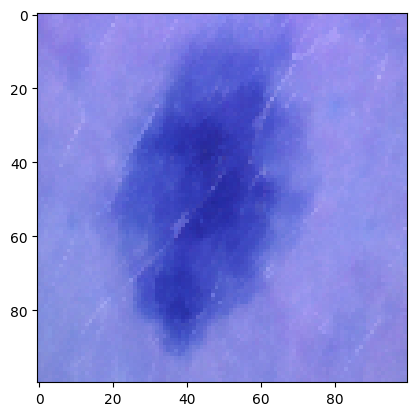

In [ ]:
from matplotlib import pyplot as plt

# from google.colab.patches import cv2_imshow
img3 = x1[54]
plt.imshow(np.squeeze(img3))


In [ ]:
np.save('ximage.npy', x1) # save
np.save('ylabels.npy', y1) # save

In [ ]:
os.listdir('/content/drive/MyDrive/skin/')

['ylabels.npy', 'ximage.npy']

In [7]:
new_num_X = np.load('/content/drive/MyDrive/skin/ximage.npy') # load
new_num_Y = np.load('/content/drive/MyDrive/skin/ylabels.npy') # load

In [8]:
y_train = to_categorical(new_num_Y, num_classes = 7)

In [9]:
X_train, X_test, y_train, y_test = train_test_split(new_num_X,                  # Images array.
                                                    y_train,            # The training set.
                                                    test_size = 0.20,   # Split data set into 20/80.
                                                    random_state = 50,  # Shuffling number to random the set.
                                                    stratify = new_num_Y)       # Mix training and test sets.
# [+] Display the count of train/test data set.
print('Train dataset shape', X_train.shape)
print('Test dataset shape', X_test.shape)

Train dataset shape (21252, 100, 100, 3)
Test dataset shape (5313, 100, 100, 3)


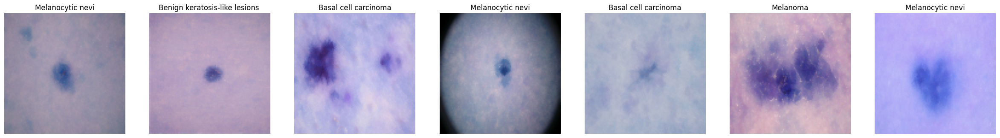

In [ ]:


def show_neg_figuers() -> None:
    """ Display negative figuers of the classes. """
    # Figure, Axes
    _, ax = plt.subplots(1, 7, figsize = (30, 30))
    for i in range(7):
        ax[i].set_axis_off()                                    # set the image to negative.
        ax[i].imshow(X_train[i])                                # Display the img.
        ax[i].set_title(lesion_names[np.argmax(y_train[i])])    # Set image title.

show_neg_figuers()



In [10]:
def est_class_weights(dis_id: np.array) -> dict:
    """Estimate class weights for unbalanced datasets.

    Args:
        dis_id (np.array): numpy array of dis IDs

    Returns:
        dict: Estimated class weights for for unbalanced datasets.
    """
    class_weights = np.around(compute_class_weight(class_weight = 'balanced', classes = np.unique(dis_id), y = new_num_Y), 2)
    class_weights = dict(zip(np.unique(dis_id), class_weights))

y_id = np.array(df_skin['lesion_ID'])
new_class_weights = est_class_weights(y_id)
print('The problem is unbalanced. We need to provide class-weights')
print(new_class_weights)

The problem is unbalanced. We need to provide class-weights
None


In [11]:
import keras
from keras.utils.np_utils import to_categorical # used for converting labels to one-hot-encoding
from keras.models import Sequential
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D
from keras import backend as K
import itertools

from tensorflow.keras import regularizers
from tensorflow.keras.layers import BatchNormalization
from keras.utils.np_utils import to_categorical # convert to one-hot-encoding
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from keras.regularizers import l2


In [12]:
img_size = [100, 100]

resnet50 = ResNet50(input_shape = img_size + [3], weights = 'imagenet', include_top = False)


94765736/94765736 [==============================] - 0s 0us/step


In [13]:
for layer in resnet50.layers:
    layer.trainable = False

In [14]:
x = Flatten()(resnet50.output)
x= (Dense(4096, activation = 'relu'))(x)
x= (Dropout(0.5))(x)
x= (Dense(4096, activation = 'relu'))(x)
x= (Dropout(0.5))(x)


# x = Dense(7,  activity_regularizer=l2(0.01))(x)

prediction = Dense(7, activity_regularizer=l2(0.01), activation='linear')(x)


In [15]:
model = Model(inputs = resnet50.input, outputs = prediction)
model.summary()

model.compile(loss='hinge', optimizer=keras.optimizers.SGD(learning_rate=0.0001,momentum=0.9,),metrics=['accuracy'])

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 100, 100, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 106, 106, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 50, 50, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 50, 50, 64)   256         ['conv1_conv[0][0]']         

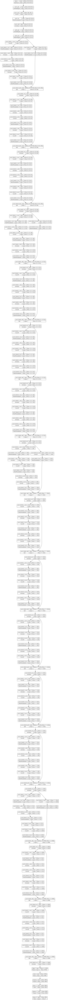

In [16]:
from tensorflow.keras.utils import plot_model
plot_model(model, to_file = 'model_plot.png', show_shapes = True, show_layer_names = True)

In [17]:
def mod_checkpoint_callback() -> None:
    """
    Saving our model
    
    Returns:
        None: Saving a checkpoint of the model.
    """
    trained_model = ModelCheckpoint(filepath = 'model.h5',  # result file name
                             save_weights_only = False,     # Save all training results/params.
                             monitor = 'val_accuracy',      # check our model accuracy if it's step forward.
                             mode = 'auto',                 # enable auto save.
                             save_best_only = True,         # if ac_new > ac_old
                             verbose = 1)
    return trained_model

# Montoring the training procces in each epoch.
early_stopping_monitor = EarlyStopping(patience = 100, monitor = 'val_accuracy')

model_checkpoint_callback = mod_checkpoint_callback()


datagen = ImageDataGenerator(zoom_range = 0.2, horizontal_flip = True, shear_range = 0.2)
datagen.fit(X_train)

batch_size = 40     # samples in the network at once.
epochs = 250        # epochs number.

# org model result data
history = model.fit(datagen.flow(X_train,y_train),
                    epochs = epochs,
                    batch_size = batch_size,
                    shuffle = True,
                    callbacks = [early_stopping_monitor, model_checkpoint_callback],
                    validation_data = (X_test, y_test),
                    class_weight = new_class_weights
                )

Epoch 1/250
665/665 [==============================] - ETA: 0s - loss: 0.7031 - accuracy: 0.3486
Epoch 1: val_accuracy improved from -inf to 0.55656, saving model to model.h5
665/665 [==============================] - 82s 106ms/step - loss: 0.7031 - accuracy: 0.3486 - val_loss: 0.3824 - val_accuracy: 0.5566
Epoch 2/250
665/665 [==============================] - ETA: 0s - loss: 0.4840 - accuracy: 0.4503
Epoch 2: val_accuracy improved from 0.55656 to 0.56748, saving model to model.h5
665/665 [==============================] - 68s 102ms/step - loss: 0.4840 - accuracy: 0.4503 - val_loss: 0.3607 - val_accuracy: 0.5675
Epoch 3/250
665/665 [==============================] - ETA: 0s - loss: 0.4405 - accuracy: 0.4846
Epoch 3: val_accuracy improved from 0.56748 to 0.58253, saving model to model.h5
665/665 [==============================] - 68s 102ms/step - loss: 0.4405 - accuracy: 0.4846 - val_loss: 0.3524 - val_accuracy: 0.5825
Epoch 4/250
665/665 [==============================] - ETA: 0s - lo

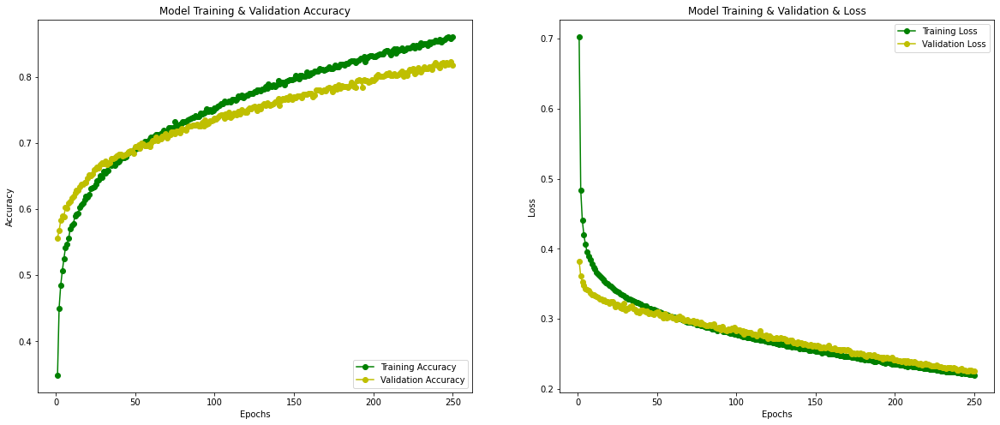

In [18]:
fig , ax = plt.subplots(1,2)
fig.set_size_inches(20, 8)

train_acc = history.history['accuracy']
train_loss = history.history['loss']
val_acc = history.history['val_accuracy']
val_loss = history.history['val_loss']

epochs = range(1, len(train_acc) + 1)

ax[0].plot(epochs , train_acc , 'g-o' , label = 'Training Accuracy')
ax[0].plot(epochs , val_acc , 'y-o' , label = 'Validation Accuracy')
ax[0].set_title('Model Training & Validation Accuracy')
ax[0].legend(loc = 'lower right')
ax[0].set_xlabel("Epochs")
ax[0].set_ylabel("Accuracy")

ax[1].plot(epochs , train_loss , 'g-o' , label = 'Training Loss')
ax[1].plot(epochs , val_loss , 'y-o' , label = 'Validation Loss')
ax[1].set_title('Model Training & Validation & Loss')
ax[1].legend()
ax[1].set_xlabel("Epochs")
ax[1].set_ylabel("Loss")

plt.show()

In [19]:
!cp model.h5 '/content/drive/MyDrive/skin/'